<a href="https://colab.research.google.com/github/subedinab/ML-projects/blob/master/image_paragraph_captioning_resnet50.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd
import cv2
import os
import tensorflow as tf
import matplotlib.pyplot as plt
import csv
from glob import glob
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from nltk.translate.bleu_score import sentence_bleu, corpus_bleu

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from keras.utils import pad_sequences
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import plot_model
from keras.models import Model, Sequential
from keras.layers import Input
from keras.layers import Dense
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.layers import Dense, Flatten,Input, Convolution2D, Dropout, LSTM, TimeDistributed, Embedding, Bidirectional, Activation, RepeatVector,Concatenate, CuDNNLSTM
from keras.models import Sequential, Model


In [ ]:
!zip -r file.zip /kaggle/working

  adding: kaggle/working/ (stored 0%)
  adding: kaggle/working/__notebook_source__.ipynb (deflated 44%)


In [ ]:
!ls

__notebook_source__.ipynb  file.zip


In [ ]:
from IPython.display import FileLink
FileLink(r'file.zip')

/kaggle/working/file.zip

In [ ]:
import zipfile
import os
from IPython.display import FileLink

def zip_dir(directory = os.curdir, file_name = 'directory.zip'):
    """
    zip all the files in a directory

    Parameters
    _____
    directory: str
        directory needs to be zipped, defualt is current working directory

    file_name: str
        the name of the zipped file (including .zip), default is 'directory.zip'

    Returns
    _____
    Creates a hyperlink, which can be used to download the zip file)
    """
    os.chdir(directory)
    zip_ref = zipfile.ZipFile(file_name, mode='w')
    for folder, _, files in os.walk(directory):
        for file in files:
            if file_name in file:
                pass
            else:
                zip_ref.write(os.path.join(folder, file))

    return FileLink(file_name)


In [ ]:
zip_dir()

/kaggle/working/directory.zip

# Preprocessing Images

Total images in dataset: 2506


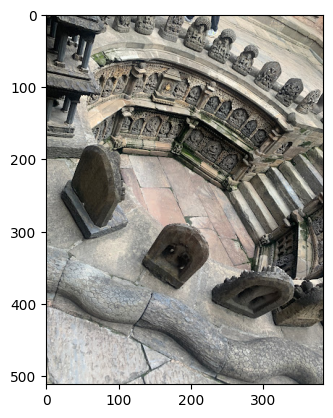

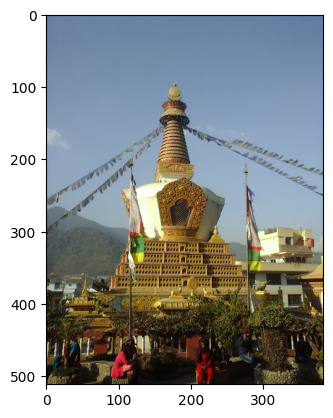

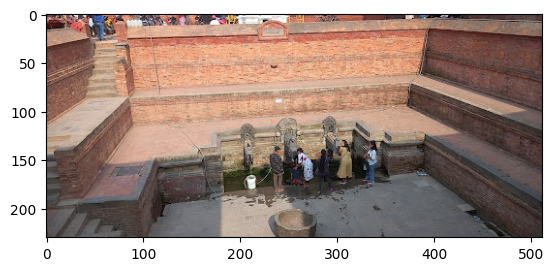

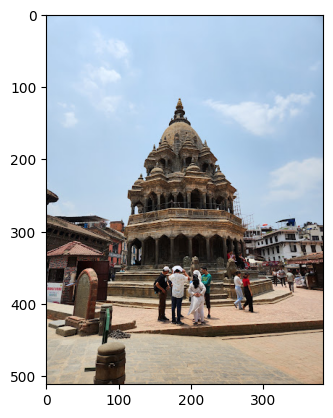

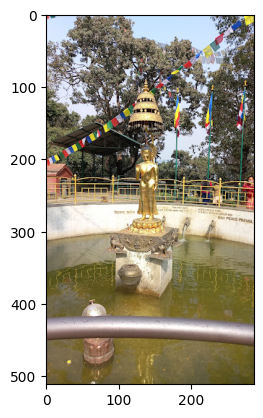

In [ ]:
images_path = '/content/drive/MyDrive/major project(test)/temple_img/content/temple_imgs/'
images = glob(images_path+'*.jpg')
print("Total images in dataset:",len(images))
for i in range(5):
    plt.figure()
    img = cv2.imread(images[i])
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.imshow(img)

In [ ]:
incept_model = ResNet50(include_top=True)
last = incept_model.layers[-2].output
CNNmodel = Model(inputs = incept_model.input,outputs = last)

102967424/102967424 [==============================] - 1s 0us/step


In [ ]:
images_features = {}
count = 0
print("Converting images to features using CNN model")
for i in images:
   img = cv2.imread(i)
   img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
   img = cv2.resize(img, (224,224))
   img = img.reshape(1,224,224,3)
   pred = CNNmodel.predict(img).reshape(2048,)
   img_name = i.split('/')[-1]
   images_features[img_name] = pred
   count += 1
   if count % 500 == 0:
       print("Completed for "+str(count)+" images")
print("length of image features:",len(images_features))
list(images_features.items())[:5]

Converting images to features using CNN model
1/1 [==============================] - 0s 197ms/step
Completed for 500 images
1/1 [==============================] - 0s 198ms/step
Completed for 1000 images
1/1 [==============================] - 0s 212ms/step
Completed for 1500 images
1/1 [==============================] - 0s 207ms/step
Completed for 2000 images
1/1 [==============================] - 0s 196ms/step
Completed for 2500 images
1/1 [==============================] - 0s 200ms/step
length of image features: 2506


[('1507.jpg',
  array([0.07309384, 2.1234536 , 0.03638625, ..., 0.02204748, 0.1422009 ,
         0.48372036], dtype=float32)),
 ('1508.jpg',
  array([0.03089731, 0.47483903, 0.        , ..., 0.0021059 , 0.01055634,
         0.42951125], dtype=float32)),
 ('1509.jpg',
  array([0.3708453 , 1.2602167 , 0.76683277, ..., 0.03261698, 0.06545223,
         0.76202625], dtype=float32)),
 ('1510.jpg',
  array([0.04887187, 0.5745059 , 0.        , ..., 0.        , 0.06841101,
         0.8229085 ], dtype=float32)),
 ('1511.jpg',
  array([0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.23437068], dtype=float32))]

In [ ]:
import pickle

#with open("../input/pertrained/images_features.pkl","rb") as f:
#    pickle.dump(images_features , f)


with open("/content/drive/MyDrive/ml/caption/pertrained/images_features.pkl","rb") as f:
    images_features=pickle.load(f)


# Preprocessing Captions and Creating Vocabulary

In [ ]:
caption_path = '/content/drive/MyDrive/ml/caption/stanford img paragraph captioning/stanford_df_rectified.csv'

with open(caption_path) as csvfile:
    captions=csv.reader(csvfile, delimiter=',', quotechar='"')
    captions_dict_train,captions_dict_test,captions_dict_val= {},{},{}
    for i in captions:
        try:
            img_name = i[0]  + ".jpg"
            caption = i[1]
            train_input=i[2]
            test_input=i[3]
            val_input=i[5]
            if img_name in images_features:
                if train_input=='True':
                    captions_dict_train[img_name] = caption
                elif test_input=='True':
                    captions_dict_test[img_name] = caption
                elif val_input=='True':
                    captions_dict_val[img_name] = caption
        except:
            pass

print("size of train, test and validation dataset:" ,len(captions_dict_train),len(captions_dict_test),len(captions_dict_val))

size of train, test and validation dataset: 14575 2489 2487


In [ ]:
def preprocessed(txt):
    modified = txt.lower().replace('.',' .').replace("'","")
    modified = 'startofseq ' + modified + ' endofseq'
    return modified

count_words = {}
print("Captions before preprocessing\n ",list(captions_dict_train.items())[:5])

for k,v in captions_dict_train.items():
    captions_dict_train[k]=preprocessed(v)

#creating count_words dict with word and frequency
for k,v in captions_dict_train.items():
    for word in v.split():
        if word not in count_words:
            count_words[word] = 1
        else:
            count_words[word] += 1

#creating words_dict as vocabulary where only words occuring more than threshold is considered
THRESH = 5
count = 1
words_dict = {}
for k,v in count_words.items():
    if count_words[k] > THRESH:
        words_dict[k] = count
        count += 1

#captions_dict converting words into numbers from words_dict
for k, v in captions_dict_train.items():
    encoded = []
    for word in v.split():
        if word in words_dict.keys():
            encoded.append(words_dict[word])

    captions_dict_train[k] = encoded

print("Captions after preprocessing\n ",list(captions_dict_train.items())[:5])

Captions before preprocessing
  [('2317429.jpg', 'A white round plate is on a table with a plastic tablecloth on it.  Two foil covered food halves are on the white plate along with a serving of golden yellow french fries.  Next to the white plate in a short,  topless, plastic container is a white sauce.  Diagonal to the white plate are the edges of several other stacked plates.  There are black shadows reflected on the table.'), ('2365091.jpg', 'A large red and white train is traveling on tracks in a what looks to be a rural area. There are trees and hills in the background and the ground looks dry. The train has many large windows for the passengers to look out of. The train is mostly white with red on the front upper part of the train and red stripes and trim on the sides. The roof of the train is grey.'), ('2383120.jpg', 'A very clean and tidy a bathroom. Everything is a neat porcelain white. This bathroom is both retro and modern.'), ('2333990.jpg', 'There are four small pizzas on 

In [ ]:
#import pickle
#
#with open("./words_dict.pkl", "wb") as f:
#    pickle.dump(words_dict , f)


# Merge Model

In [ ]:
'''
vocab_size = len(words_dict)+1
MAX_LEN = 0

for k, v in captions_dict_train.items():
    if len(v) > MAX_LEN:
        MAX_LEN = len(v)

# feature extractor model
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

# language sequence model
inputs2 = Input(shape=(MAX_LEN,))
se1 = Embedding(vocab_size, MAX_LEN, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

# decoder model
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)

# tie it together [image, seq] [word]
model = Model(inputs=[inputs1, inputs2], outputs=outputs)
# compile model
model.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])
# summarize model
model.summary()
plot_model(model, show_shapes=True)
'''

"\nvocab_size = len(words_dict)+1\nMAX_LEN = 0\n\nfor k, v in captions_dict_train.items():\n    if len(v) > MAX_LEN:\n        MAX_LEN = len(v)  \n        \n# feature extractor model\ninputs1 = Input(shape=(2048,))\nfe1 = Dropout(0.5)(inputs1)\nfe2 = Dense(256, activation='relu')(fe1)\n\n# language sequence model\ninputs2 = Input(shape=(MAX_LEN,))\nse1 = Embedding(vocab_size, MAX_LEN, mask_zero=True)(inputs2)\nse2 = Dropout(0.4)(se1)\nse3 = LSTM(256)(se2)\n\n# decoder model\ndecoder1 = add([fe2, se3])\ndecoder2 = Dense(256, activation='relu')(decoder1)\noutputs = Dense(vocab_size, activation='softmax')(decoder2)\n\n# tie it together [image, seq] [word]\nmodel = Model(inputs=[inputs1, inputs2], outputs=outputs)\n# compile model\nmodel.compile(loss='categorical_crossentropy', optimizer='adam',metrics=['accuracy'])\n# summarize model\nmodel.summary()\nplot_model(model, show_shapes=True)\n"

# Training RNN- Using Generator Function to create input

In [ ]:
N=32 #BatchSize
VOCAB_SIZE = len(words_dict)+1

def progressive_generator(photo_dict, caption_dict, MAX_LEN,VOCAB_SIZE):
    while 1:
        for i in range(0,len(caption_dict),N):
            caption = dict(list(caption_dict.items())[0+i: N+i])
            X, y_in, y_out = create_sequences(photo_dict,caption,MAX_LEN, VOCAB_SIZE)
            yield [X, y_in], y_out


def create_sequences(photo, caption, MAX_LEN,VOCAB_SIZE):
    #n_samples = 0
    X,y_in,y_out = [],[],[]

    for k, v in caption.items():
        for i in range(1, len(v)):
            X.append(photo[k])

            in_seq= [v[:i]]
            out_seq = v[i]

            in_seq = pad_sequences(in_seq, maxlen=MAX_LEN, padding='post', truncating='post')[0]
            out_seq = to_categorical([out_seq], num_classes=VOCAB_SIZE)[0]

            y_in.append(in_seq)
            y_out.append(out_seq)

    return np.array(X), np.array(y_in), np.array(y_out)

In [ ]:
#steps = len(captions_dict_train)/N
#generator = progressive_generator(images_features, captions_dict_train, MAX_LEN, VOCAB_SIZE)
#model.fit(generator, epochs=50, steps_per_epoch=steps, verbose=1)
#model.save('./image_caption_model_newarch50' + '.h5')

In [ ]:
#from IPython.display import FileLink
#FileLink(r'./words_dict.pkl')

#  Prediction

In [ ]:
vocab_size = len(words_dict)+1
MAX_LEN = 0

for k, v in captions_dict_train.items():
    if len(v) > MAX_LEN:
        MAX_LEN = len(v)

inv_dict = {v:k for k, v in words_dict.items()}

In [ ]:
## For selected test images

#2373586.jpg 75 epoch
#2361833.jpg 75 epoch

#2394335.jpg 150 epoch
#2364210.jpg 150 epoch
#2402430.jpg 2395361.jpg 150 epoch
#2335374.jpg 2373374.jpg 150 epoch


model = tf.keras.models.load_model('/content/drive/MyDrive/ml/caption/imagecaptioningmodels/image_caption_model_newarch150.h5')
img_name='1.jpg'
test_feature = images_features[img_name]
test_img_path = '/content/drive/MyDrive/ml/caption/temple_img/content/temple_imgs/1.jpg'
test_img = cv2.imread(test_img_path)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)


text_inp = ['startofseq']
count = 0
caption = ''
while count < MAX_LEN:
    count += 1
    encoded = []
    for i in text_inp:
        encoded.append(words_dict[i])
    encoded = [encoded]
    encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)
    data_list=[np.array(test_feature).reshape(1,-1), np.array(encoded).reshape(1,-1)]
    prediction = np.argmax(model.predict(data_list))
    sampled_word = inv_dict[prediction]
    caption = caption + ' ' + sampled_word

    if sampled_word == 'endofseq':
        break
    text_inp.append(sampled_word)

caption= caption.replace('endofseq','')
predicted= caption.split()
# actual= captions_dict_test[img_name].split()

# blueScore= sentence_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25))

# print('BLEU-1: %f' % sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
# print('BLEU-2: %f' % sentence_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
# print('BLEU-3: %f' % sentence_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
# print('BLEU-4: %f' % sentence_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

plt.figure()
plt.imshow(test_img)
# plt.title(img_name+" - BLUE Score: "+str(blueScore))
plt.show()
print(caption.replace(' .','.'))

KeyError: ignored

1/1 [==============================] - 0s 105ms/step


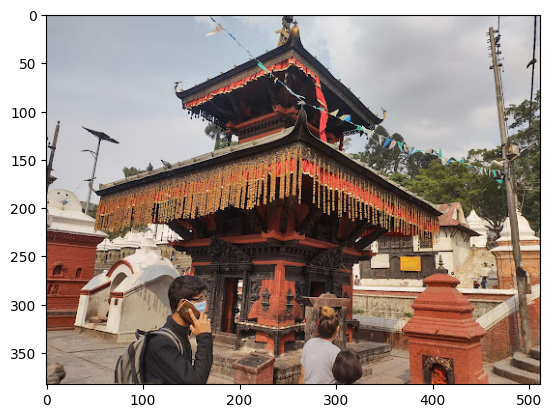

 a large black and white clock is on a street. the spire of the bridge is covered with white painted. the spire of the hydrant is color black. there is a large white steeple on the boat. a flag hangs on the side of the boat. a flag hangs on the building. a person is standing on the sidewalk. a person is standing near the statue. the sky is blue with white clouds. 
1/1 [==============================] - 0s 70ms/step


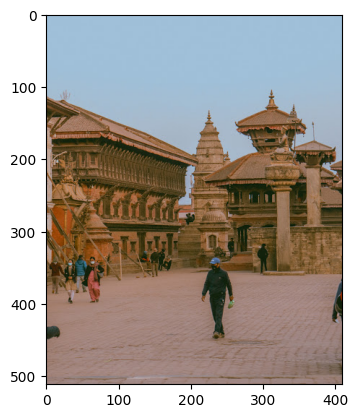

 a large white bird is standing on a wooden railing. the bird is flying high in the sky above a large sandy field. the bird is perched on the ground and the skateboard is on the ground. the sky above is blue with white clouds. the sky above is blue with white clouds. the sky above is blue with white clouds. 


In [ ]:
model = tf.keras.models.load_model('/content/drive/MyDrive/ml/caption/imagecaptioningmodels/image_caption_model_newarch75.h5')

plt.figure()
for i in range(1,3):


    img_name = f'{i}.jpg'
    test_feature = images_features.get(img_name)  # Retrieve features from images_features dictionary
    test_img_path = f'/content/drive/MyDrive/ml/caption/temple_img/content/temple_imgs/{i}.jpg'

    test_img = cv2.imread(test_img_path)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    text_inp = ['startofseq']

    count = 0
    caption = ''
    while count < MAX_LEN:
        count += 1

        encoded = []
        for i in text_inp:
            encoded.append(words_dict[i])

        encoded = [encoded]
        encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)
        data_list = [np.array(test_feature).reshape(1,-1), np.array(encoded).reshape(1,-1)]
        prediction = np.argmax(model.predict(data_list))
        sampled_word = inv_dict[prediction]
        caption = caption + ' ' + sampled_word

        if sampled_word == 'endofseq':
            break

        text_inp.append(sampled_word)

    caption = caption.replace('endofseq','')
    predicted = caption.split()




    plt.imshow(test_img)
    plt.show()
    print(caption.replace(' .', '.'))




1/1 [==============================] - 0s 75ms/step


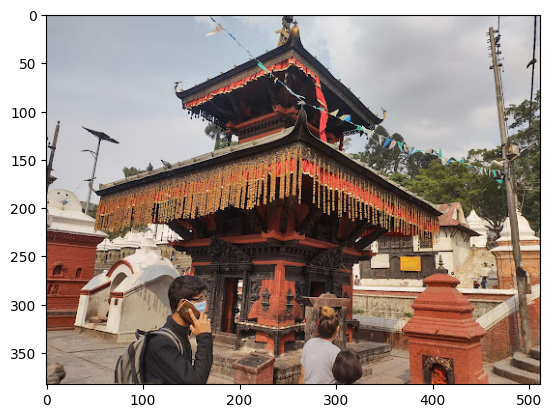

 a large black and white clock is on a street. the spire of the bridge is covered with white painted. the spire of the hydrant is color black. there is a large white steeple on the boat. a flag hangs on the side of the boat. a flag hangs on the building. a person is standing on the sidewalk. a person is standing near the statue. the sky is blue with white clouds. 
1/1 [==============================] - 0s 83ms/step


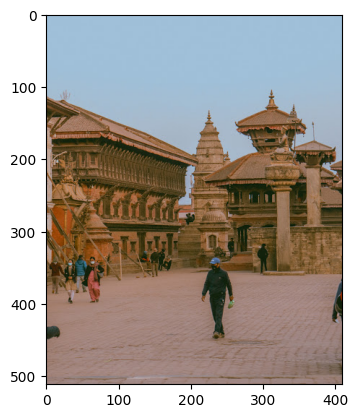

 a large white bird is standing on a wooden railing. the bird is flying high in the sky above a large sandy field. the bird is perched on the ground and the skateboard is on the ground. the sky above is blue with white clouds. the sky above is blue with white clouds. the sky above is blue with white clouds. 
1/1 [==============================] - 0s 75ms/step


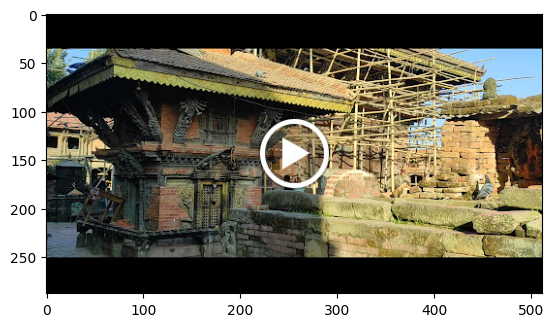

 a man is standing on a sidewalk outside on a sunny day. he is wearing a short sleeve shirt and jean pants. the horse is wearing a white shirt and blue jean pants. there is a chain link fence behind the man. a tall building is standing near the sidewalk. a tall tower is standing near the building. 
1/1 [==============================] - 0s 73ms/step


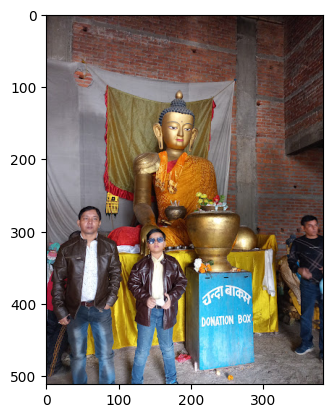

 a woman is sitting on a couch. she is wearing a decorative shirt and blue jean pants. the woman is holding a folder covered in white frosting. there is a large black bag on the table. part of a persons hand can be seen standing behind the woman. part of a white sky can be seen below the plants. 
1/1 [==============================] - 0s 116ms/step


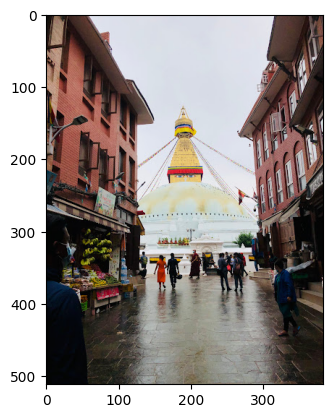

 a man is standing on a sidewalk holding a camera to his face. he is wearing a black shirt and black pants. there is a large crowd of people standing at the top of the sidewalk. a large crowd of people are standing in front of the building. part of a building can be seen in the background. 
1/1 [==============================] - 0s 95ms/step


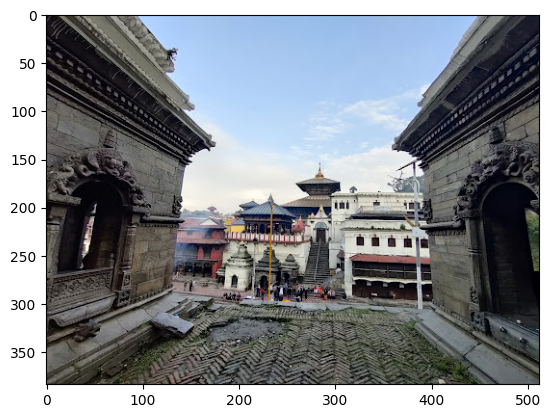

 a clock tower is attached to a building. the tower is made of brick. the tower is made of brick. the building is made of bricks. the building is made of bricks. the stones are white. the sky above is blue. there is a clock on the tower. the tower is brown. 
1/1 [==============================] - 0s 87ms/step


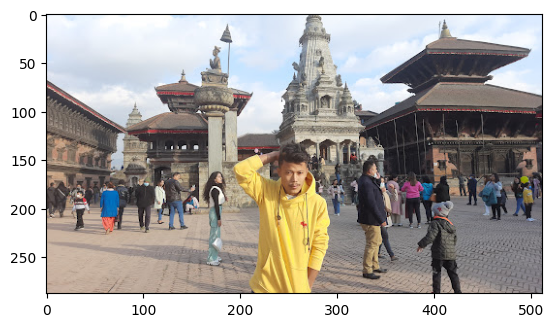

 a man is standing on a sidewalk holding a camera to his face. he is wearing a black cap, a white shirt and black pants. the man is holding a folder under his arm. a man is standing on the sidewalk in front of the man. people are walking on the sidewalk near the sidewalk. part of a building can be seen in the background of the photo. 
1/1 [==============================] - 0s 73ms/step


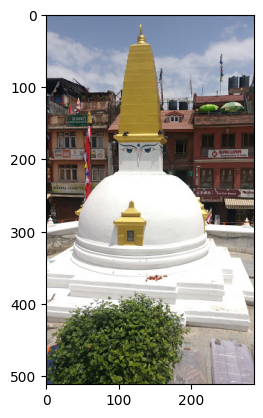

 a large white and white boat is sitting on a deck. there is a large white crane on the ground next to the umbrella. there is a white building behind the man. there is a white sign on the front of the train. there is a white sign on the front of the train. 
1/1 [==============================] - 0s 84ms/step


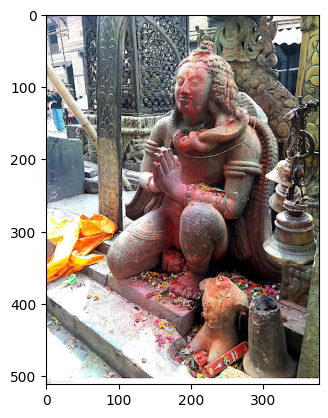

 a young girl is sitting on a bench. the baby is wearing a blue shirt and blue pants. she is holding a teddy bear in her hands. the bear is wearing a white shirt and blue shorts. the girl is wearing a white shirt and blue pants. the girl is holding a teddy bear in his hands. 
1/1 [==============================] - 0s 100ms/step


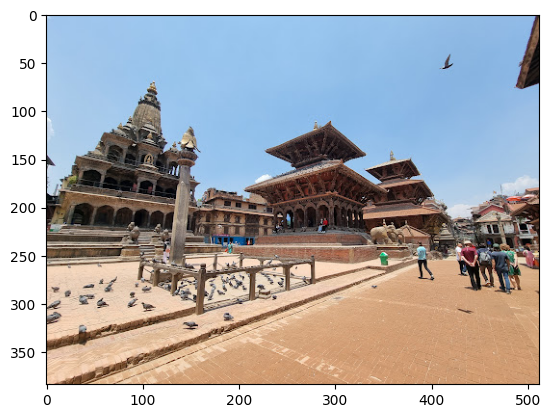

 a man is standing on a sidewalk holding a kite in his hands. the kite is white and blue. the sky above the bridge is covered with white clouds. there are numerous objects on the water. a tall building is on the side of the bridge. a tall tower is standing near the plane. a tall tower is standing near the plane. 
1/1 [==============================] - 0s 129ms/step


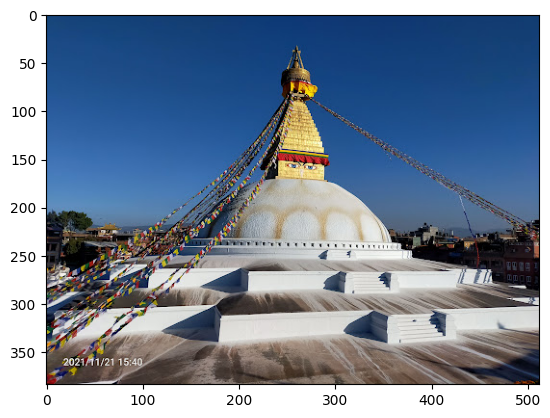

 a man is riding a snowboard on a snow board. the man is wearing a black helmet and goggles. the man is wearing a black helmet on his head. the man is wearing a black wetsuit. the man is wearing a black helmet on his head. the man is wearing a black wetsuit. the man is wearing a black wetsuit. the man is wearing black pants. the man is wearing black pants. the man is wearing black pants. 
1/1 [==============================] - 0s 128ms/step


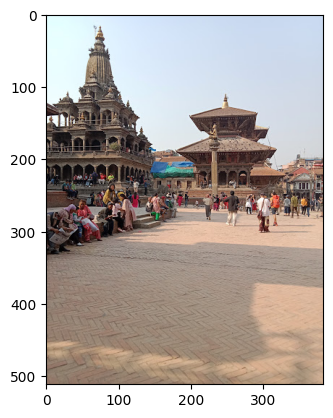

 a man is standing on a boat outside on a sunny day. he is wearing a black helmet on his head, a helmet and a black and white shirt. the man is holding a black and white surfboard under his arm. a man is standing on the boat. a tall building is standing near the man. a tall building is standing near the water. a large body of water is sitting near the water. 
1/1 [==============================] - 0s 89ms/step


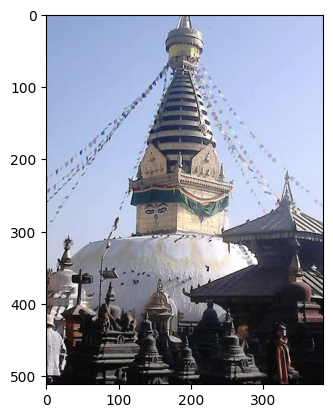

 a fishing type of water is in the water. the ship is on a wooden dock. the boat is white with a black band on the top. the face of the boat is white with a black roman. the sky is blue with white clouds. the sky is blue with white clouds. the water is blue. 
1/1 [==============================] - 0s 85ms/step


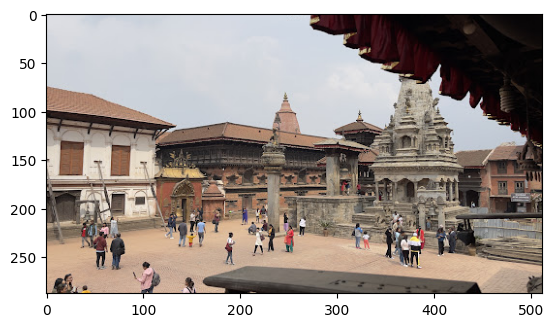

 a man is standing on a sidewalk outside on a sunny day. he is wearing a black shirt and black pants. the man is holding a folder under his arm. a white surfboard is flying above the man. a tall building can be seen behind the man. a tall building is standing near the building. a tall tower is standing near the building. 
1/1 [==============================] - 0s 100ms/step


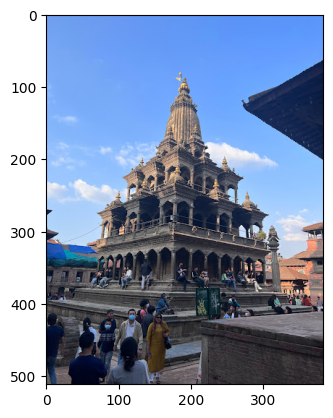

 a large crowd of people are standing on a pier. the fountain is made of wood and has a design on it. the clock is white with a white roman and black hands. the sky is blue with white clouds. the sky is blue with white clouds. the sky is blue with white clouds. 
1/1 [==============================] - 0s 181ms/step


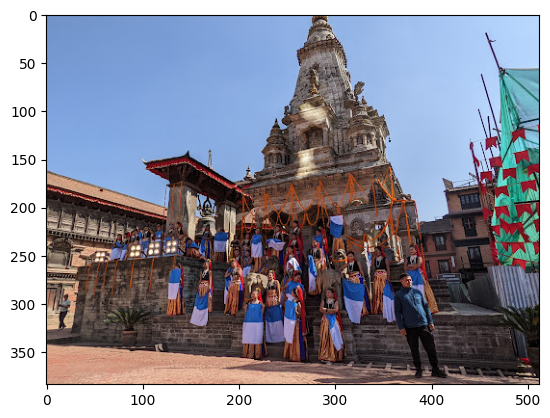

 a woman is standing on a stone floor. she is wearing a black jacket and black pants. the woman is wearing a black jacket and black pants. the woman is wearing a black jacket and black pants. there is a large black steeple on the ground. part of a building can be seen behind the woman. 
1/1 [==============================] - 0s 196ms/step


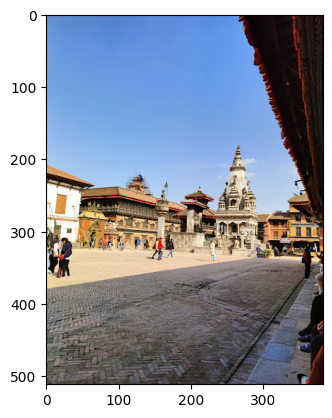

 a man is standing on a sidewalk holding a kite in his hands. the bridge is made of stone. there is a large white cloud in the air. there is a large white tower on the side of the bridge. there is a large white steeple on the sidewalk. there is a large white tower on the side of the bridge. there is a large white steeple on the sidewalk. 
1/1 [==============================] - 0s 106ms/step


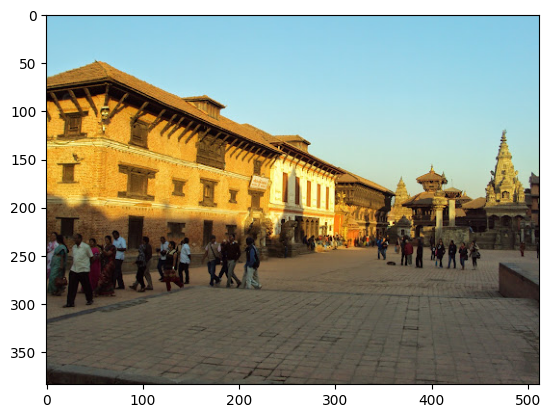

 a man is standing on a sidewalk holding a skateboard in his hand. he is wearing a black shirt and jean pants. the man is holding a folder under his arm. a man is standing on the sidewalk in front of the man. there is a large black steeple on the sidewalk. a tall building is standing near the sidewalk. 
1/1 [==============================] - 0s 160ms/step


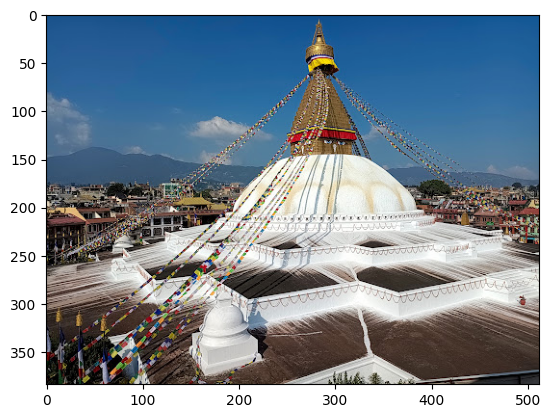

 a man is standing on a snow covered ground. he is wearing a black shirt and black pants. the man is holding a folder under his arm. the umbrella is hanging on a white painted pole. a white power line is running across the sky. a person is standing on the side of the road. tall leafless trees are standing near the bridge. 
1/1 [==============================] - 0s 107ms/step


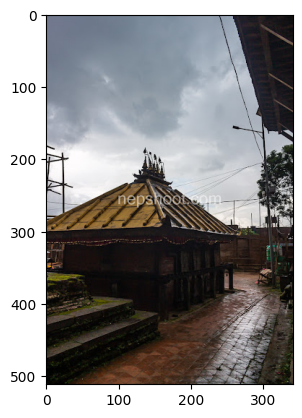

 a train is on the tracks. the bridge is made of metal. the railing is white. the bridge is made of metal. the railing is white. the sky is blue with white clouds. the bridge is made of metal. the railing is white. the sky is blue with white clouds. the bridge is white. 
1/1 [==============================] - 0s 99ms/step


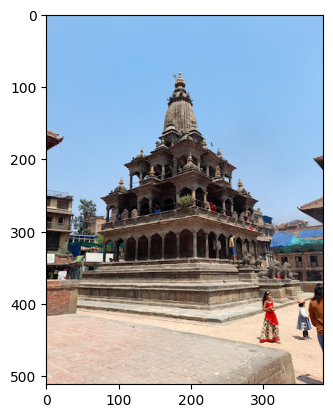

 a large white and black boat is on the water. there is a large white crane in front of the building. there is a large white building behind the boats. there is a large white building in front of the building. there is a large white tower in the distance. 
1/1 [==============================] - 0s 115ms/step


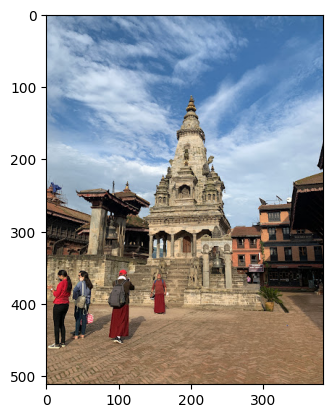

 a man is standing on a bridge outside on a sunny day. he is wearing a short sleeve shirt and shorts. the man is wearing a black cap, a white shirt and black pants. there is a large black steeple on the ground near the man. a tall building is standing near the man. a tall building is standing near the building. a tall tower is standing near the building. 
1/1 [==============================] - 0s 99ms/step


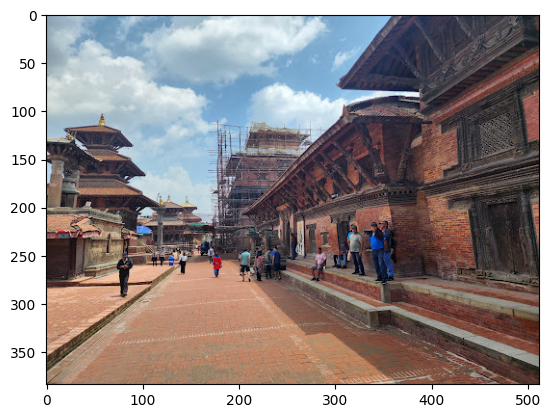

 a man is walking on a sidewalk. the man is wearing a black jacket and black pants. the man is holding a folder under his arm. the bridge is made of stone. there is a large white building in the background. a tall building is standing near the road. a large building is standing near the building. 
1/1 [==============================] - 0s 104ms/step


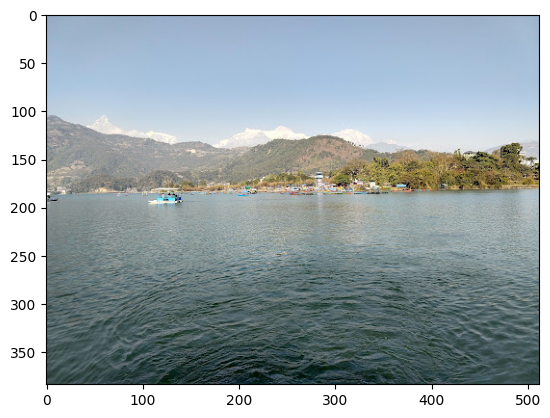

 a man is surfing on a wave. the wave is white and has a design on it. the man is wearing a black wetsuit. the man is wearing a black wetsuit. the man is wearing a wetsuit. the wetsuit is black. the man is wearing a wetsuit. the wetsuit is black. the man is wearing a wetsuit. the wetsuit is black. the man is wearing a wetsuit. 
1/1 [==============================] - 0s 152ms/step


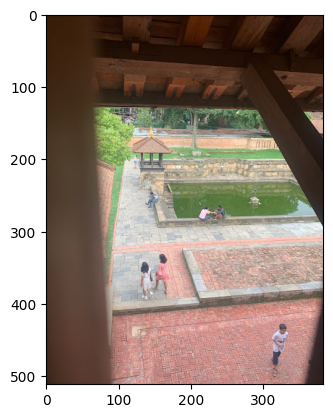

 a cat is sleeping on a shelf. the bench is wooden and is surrounded by gravel. the bench is made of wood. the wood is a light brown color. there is a tree in the window. the bench is made of wood. the bench is made of wood. the bench is made of wood. the bench is brown. 
1/1 [==============================] - 0s 134ms/step


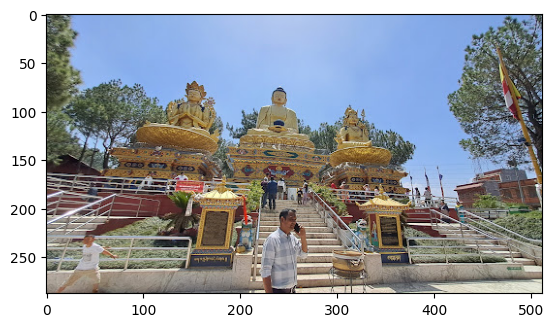

 a man is standing on a sidewalk holding a kite in his hands. he is wearing a short sleeve shirt and pants. the man is wearing a cap on his head, a shirt and shorts. a man is standing on the sidewalk behind the man. a tall building is standing near the man. there is a large white steeple on the sidewalk. 
1/1 [==============================] - 0s 115ms/step


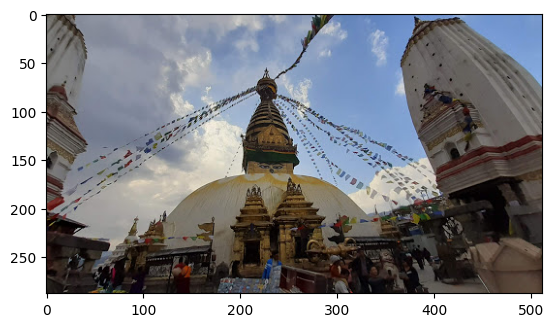

 a woman is standing on a sidewalk holding a umbrella, set in front of her. the woman is wearing a black jacket and black pants. the woman is wearing a black jacket and black pants. the woman is holding a folder under her right arm. the woman is wearing a black top and jean pants. the woman is wearing a black jacket and black pants. a black dog is hanging on the womans hair. a tall roman tree is standing on the sidewalk. 
1/1 [==============================] - 0s 109ms/step


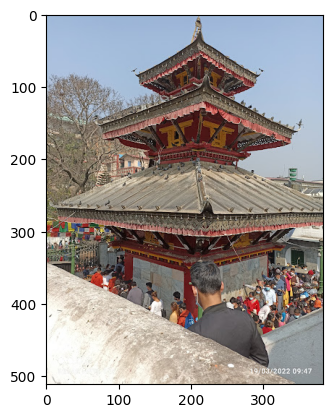

 a man is standing on a track outside on a sunny day. he is wearing a black shirt and black pants. the man is holding a black bag in his hands. there is a large black pipe running across the area. part of a building can be seen behind the man. part of a building can be seen behind the trees. 
1/1 [==============================] - 0s 171ms/step


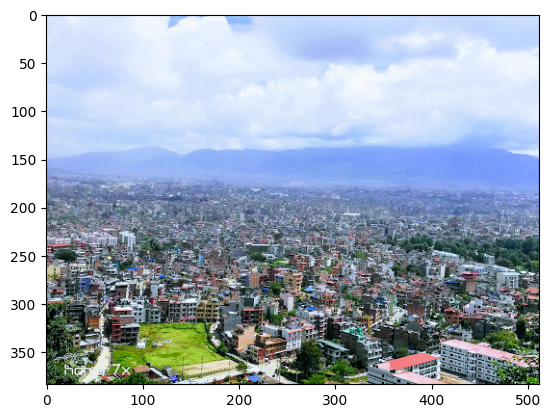

 a bunch of boats are in rows of spectators. the boats are white with white stripes on them. the boats are all white with white stripes on them. there are people standing on the grass. there are many white kites in the air. the sky is blue with white clouds. the sky is blue with white clouds. 
1/1 [==============================] - 0s 140ms/step


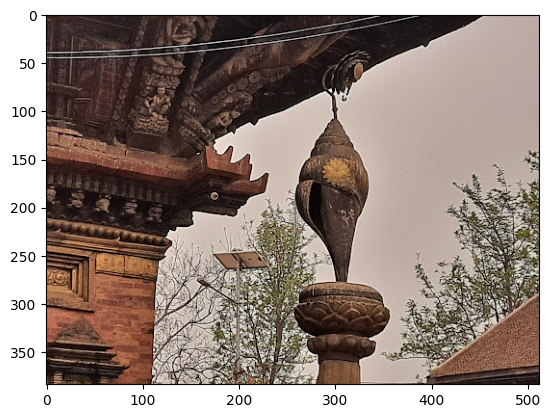

 a large white building with a large tower with a large window on the side of it is on the right. there is a large metal tower on the right of the building. there is a large metal railing on the side of the building. there is a large white statue on the dock next to the building. there is a large white statue on the ground next to the statue. 
1/1 [==============================] - 0s 148ms/step


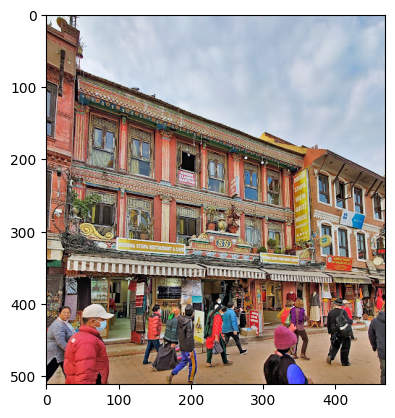

 a man is standing on a sidewalk holding a camera to his face. he is wearing a long sleeve shirt and shorts. the man is wearing a black cap, a white shirt and blue pants. there is a large black dog standing on the ground near the man. a tall building is standing behind the man. part of a building can be seen behind the man. 
1/1 [==============================] - 0s 105ms/step


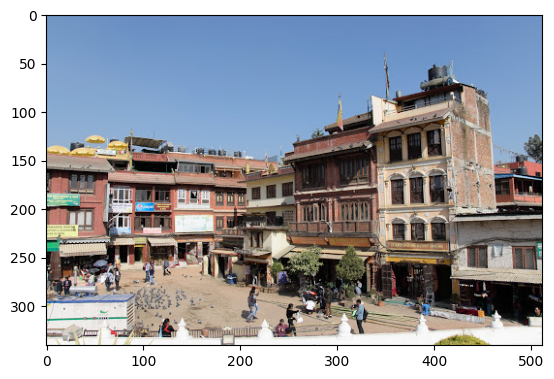

 a large crowd of people are walking on a sandy beach. the sky is blue with white clouds. the sky is blue with white clouds. a small white building is on the side of the building. a small white building is standing near the building. a tall tower is standing on the other side of the building. a tall tower is standing on the other side of the building. 
1/1 [==============================] - 0s 108ms/step


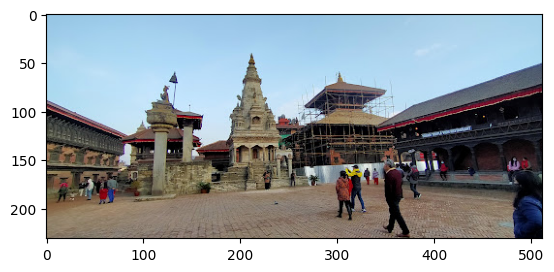

 a man is standing on a sidewalk. he is wearing a black shirt and pants. the man is holding a folder under his arm. a man is standing on the sidewalk wearing a cap. he is wearing a black jacket and black pants. there is a large black dog standing on the sidewalk near the man. 
1/1 [==============================] - 0s 146ms/step


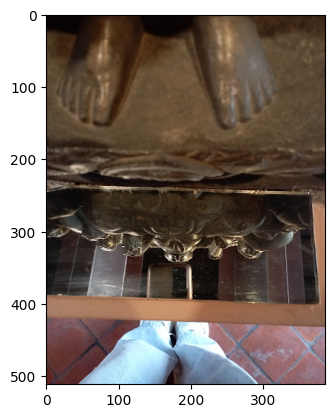

 a cat is laying on the ground. the cat is white. the cat is black. the cat is black. the cat is laying on the bed. the cat is black. the cat is laying on the bed. the cat is laying on the bed. the cat is looking up at the camera. the cat is looking up at the camera. 
1/1 [==============================] - 0s 116ms/step


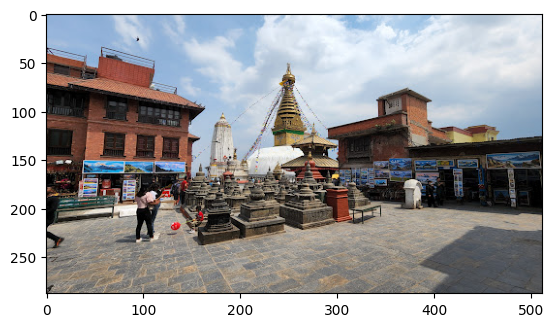

 a man is standing on a sidewalk holding a camera to his face. he is wearing a black shirt and black pants. there is a large crowd gathered on the sidewalk. a large crowd of people are standing near the large trees watching the people. there is a large white building in the background. a tall white building can be seen in the background. 
1/1 [==============================] - 0s 134ms/step


KeyboardInterrupt: ignored

In [ ]:
import csv

model = tf.keras.models.load_model('/content/drive/MyDrive/ml/caption/imagecaptioningmodels/image_caption_model_newarch75.h5')

with open('/content/drive/MyDrive/ml/caption/paragraph_caption.csv', 'w+', newline='') as csvfile:
    fieldnames = ['Image', 'Caption']
    writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
    writer.writeheader()

    for i in range(1, 2500):
        img_name = f'{i}.jpg'
        test_feature = images_features.get(img_name)
        test_img_path = f'/content/drive/MyDrive/ml/caption/temple_img/content/temple_imgs/{i}.jpg'

        test_img = cv2.imread(test_img_path)
        test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

        text_inp = ['startofseq']

        count = 0
        caption = ''
        while count < MAX_LEN:
            count += 1

            encoded = []
            for i in text_inp:
                encoded.append(words_dict[i])

            encoded = [encoded]
            encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)
            data_list = [np.array(test_feature).reshape(1, -1), np.array(encoded).reshape(1, -1)]
            prediction = np.argmax(model.predict(data_list))
            sampled_word = inv_dict[prediction]
            caption = caption + ' ' + sampled_word

            if sampled_word == 'endofseq':
                break

            text_inp.append(sampled_word)

        caption = caption.replace('endofseq', '')
        predicted = caption.split()

        writer.writerow({'Image': img_name, 'Caption': caption.replace(' .', '.')})

        plt.imshow(test_img)
        plt.show()
        print(caption.replace(' .', '.'))

print("Captions saved to captions.csv")


In [ ]:
import csv

results = []

model = tf.keras.models.load_model('/content/drive/MyDrive/ml/caption/imagecaptioningmodels/image_caption_model_newarch150.h5')

for i in range(1,2450):
    test_img_path = f'/content/drive/MyDrive/ml/caption/temple_img/content/temple_imgs/{i}.jpg'
    print(test_img_path)
    test_img = cv2.imread(test_img_path)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    text_inp = ['startofseq']
    count = 0
    caption = ''

    while count < MAX_LEN:
        count += 1
        encoded = []

        for word in text_inp:
            encoded.append(words_dict[word])

        encoded = [encoded]
        encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)

        data_list = [np.array(images_features[test_img_path]).reshape(1, -1), np.array(encoded).reshape(1, -1)]
        prediction = np.argmax(model.predict(data_list))
        sampled_word = inv_dict[prediction]
        caption = caption + ' ' + sampled_word

        if sampled_word == 'endofseq':
            break

        text_inp.append(sampled_word)

    caption = caption.replace('endofseq', '')
    predicted = caption.split()

    results.append({'Image': test_img_path, 'Caption': caption})

output_file = '/content/drive/MyDrive/ml/caption/paragraph_caption.csv'

with open(output_file, 'w', newline='') as csvfile:
    writer = csv.DictWriter(csvfile, fieldnames=['Image', 'Caption'])
    writer.writeheader()
    writer.writerows(results)

print(f"Predictions saved to {output_file}.")


/content/drive/MyDrive/ml/caption/temple_img/content/temple_imgs/1.jpg


KeyError: ignored

In [ ]:
## For selected test images

#2373586.jpg 75 epoch
#2361833.jpg 75 epoch

#2394335.jpg 150 epoch
#2364210.jpg 150 epoch
#2402430.jpg 2395361.jpg 150 epoch
#2335374.jpg 2373374.jpg 150 epoch


model = tf.keras.models.load_model('../input/imagecaptioningmodels/image_caption_model_newarch150.h5')
img_name='2364210.jpg'
test_feature = images_features[img_name]
test_img_path = '../input/stanford-image-paragraph-captioning-dataset/stanford_img/content/stanford_images/'+img_name
test_img = cv2.imread(test_img_path)
test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)


text_inp = ['startofseq']
count = 0
caption = ''
while count < MAX_LEN:
    count += 1
    encoded = []
    for i in text_inp:
        encoded.append(words_dict[i])
    encoded = [encoded]
    encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)
    data_list=[np.array(test_feature).reshape(1,-1), np.array(encoded).reshape(1,-1)]
    prediction = np.argmax(model.predict(data_list))
    sampled_word = inv_dict[prediction]
    caption = caption + ' ' + sampled_word

    if sampled_word == 'endofseq':
        break
    text_inp.append(sampled_word)

caption= caption.replace('endofseq','')
predicted= caption.split()
actual= captions_dict_test[img_name].split()

blueScore= sentence_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25))

print('BLEU-1: %f' % sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
print('BLEU-2: %f' % sentence_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
print('BLEU-3: %f' % sentence_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
print('BLEU-4: %f' % sentence_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

plt.figure()
plt.imshow(test_img)
plt.title(img_name+" - BLUE Score: "+str(blueScore))
plt.show()
print(caption.replace(' .','.'))

In [ ]:
## For random test images

model = tf.keras.models.load_model('/content/drive/MyDrive/ml/caption/imagecaptioningmodels/image_caption_model_newarch75.h5')

plt.figure()
for i in range(3):

    # num=  np.random.randint(0,len(captions_dict_test))
    # img_name=list(captions_dict_test)[num]
    test_feature = images_features[img_name]
    test_img_path = f'/content/drive/MyDrive/ml/caption/temple_img/content/temple_imgs/{i}.jpg'

    test_img = cv2.imread(test_img_path)
    test_img = cv2.cvtColor(test_img, cv2.COLOR_BGR2RGB)

    text_inp = ['startofseq']

    count = 0
    caption = ''
    while count < MAX_LEN:
        count += 1

        encoded = []
        for i in text_inp:
            encoded.append(words_dict[i])

        encoded = [encoded]
        encoded = pad_sequences(encoded, padding='post', truncating='post', maxlen=MAX_LEN)
        data_list=[np.array(test_feature).reshape(1,-1), np.array(encoded).reshape(1,-1)]
        prediction = np.argmax(model.predict(data_list))
        sampled_word = inv_dict[prediction]
        caption = caption + ' ' + sampled_word

        if sampled_word == 'endofseq':
            break

        text_inp.append(sampled_word)

    caption= caption.replace('endofseq','')
    predicted= caption.split()
    actual= captions_dict_test[img_name].split()

    blueScore= sentence_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25))

    plt.imshow(test_img)
    plt.title(img_name+" - BLUE Score: "+str(blueScore))
    plt.show()
    print(caption.replace(' .','.') )
    print('BLEU-1: %f' % sentence_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % sentence_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % sentence_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % sentence_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))

